# Project: Fruit freshness detector

In [1]:
import torch, torchvision, matplotlib.pyplot as plt, sklearn, tqdm.notebook as tqdm, time
from sklearn.exceptions import ConvergenceWarning
import warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)
import itertools
from torchmetrics.classification import MulticlassF1Score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

import pandas as pd
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score
import torch.optim as optim
import torch
import torch.nn as nn
import torch.utils.data
from IPython.display import clear_output
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image
import shutil
import random

### Steps to Load and Prepare the Dataset

- Resize All Images to a Standard Size: This will ensure that all images are compatible with the model input dimensions. A standard size (e.g., 224x224 pixels) is common for convolutional neural networks.
- Split Data into Training, Validation, and Test Sets: It’s a good practice to do this upfront to ensure consistent evaluation and avoid data leakage.

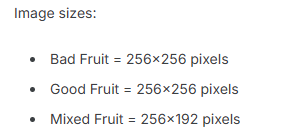


In [2]:
# Resize the Mixed fruit data

def verify_image_sizes(base_dir, target_size=(224, 224)):
    # Track any images that do not match the target size
    incorrect_sizes = []
    
    # Loop over each folder to find mixed image classes
    for folder_name in os.listdir(base_dir):
        if 'mixed' in folder_name:  # Only check "mixed" folders
            folder_path = os.path.join(base_dir, folder_name)
            for img_name in os.listdir(folder_path):
                img_path = os.path.join(folder_path, img_name)
                img = Image.open(img_path)
                
                # Check if image size matches the target size
                if img.size != target_size:
                    incorrect_sizes.append((folder_name, img_name, img.size))

    # Print results
    if incorrect_sizes:
        print("Images with incorrect sizes:")
        for folder, img, size in incorrect_sizes:
            print(f"Image {img} in folder {folder} has size {size}, expected {target_size}")
    else:
        print("All images have the correct size:", target_size)

# Define the path to your data directory
data_dir = "data"

# Verify image sizes
verify_image_sizes(data_dir, target_size=(224, 224))

All images have the correct size: (224, 224)


### Labeling data
 leveraging an existing object detection model to generate initial bounding boxes is a smart choice, especially given the size of your dataset and the time-saving benefits. Using a pretrained model, like YOLOv5, allows you to automatically create bounding boxes around the fruits, which you can then refine as needed. This approach, often called semi-automatic labeling, can drastically reduce the manual effort required to label thousands of images.

Step 1: Clone the YOLOv5 Repository and Install Dependencies
You can run the following commands directly in a Jupyter notebook cell by prefixing each command with !.

In [ ]:
# Clone the YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
# Change directory to YOLOv5
%cd yolov5
# Install required dependencies
!pip install -r requirements.txt


[WinError 2] The system cannot find the file specified: 'yolov5'
c:\Users\cheng\Documents\VSC\Higher_level_CV\Examination_project


'git' is not recognized as an internal or external command,
operable program or batch file.
C:\Users\cheng\AppData\Roaming\Python\Python39\site-packages\IPython\core\magics\osm.py:393: UserWarning: using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


Step 2: Verify the Installation
Run the following to verify that YOLOv5 was set up correctly and can be imported as a module in the notebook.



In [ ]:
import torch

# Load a pretrained YOLOv5 model from the cloned repository
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)


# this is not a fine tuned model on our data

c:\Users\cheng\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\cheng/.cache\torch\hub\master.zip


Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\cheng\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
requirements: Ultralytics requirements ['gitpython>=3.1.30', 'setuptools>=70.0.0'] not found, attempting AutoUpdate...
   ---------------------------------------- 1.2/1.2 MB 15.5 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 58.1.0
    Uninstalling setuptools-58.1.0:
      Successfully uninstalled setuptools-58.1.0

requirements: AutoUpdate success  11.6s, installed 2 packages: ['gitpython>=3.1.30', 'setuptools>=70.0.0']
requirements:  Restart runtime or rerun command for updates to take effect



YOLOv5  2024-11-15 Python-3.9.10 torch-2.5.0+cpu CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 26.4MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Step 3: Run Inference on Your Dataset and Save Bounding Boxes
With the model loaded, we can run inference on your images and save the output in YOLO format. Make sure to specify the path to your images folder.

Define Paths and Create Output Directory for Labels

In [41]:
import os
from PIL import Image
import torch

# Define paths
base_image_dir = r'data'  # The main folder containing subfolders of each class
output_label_dir = r'labeled_data'  # Folder where labels will be saved
os.makedirs(output_label_dir, exist_ok=True)

# Loop through each subfolder (each fruit class)
for class_folder in os.listdir(base_image_dir):
    class_folder_path = os.path.join(base_image_dir, class_folder)
    
    if os.path.isdir(class_folder_path):  # Ensure it's a directory
        # Make a corresponding folder in the output labels directory
        class_output_dir = os.path.join(output_label_dir, class_folder)
        os.makedirs(class_output_dir, exist_ok=True)

        # Loop through each image in the class folder
        for image_file in os.listdir(class_folder_path):
            if image_file.endswith('.jpg') or image_file.endswith('.png'):
                # Load the image
                img_path = os.path.join(class_folder_path, image_file)
                img = Image.open(img_path)
                width, height = img.size  # Get image dimensions

                # Run YOLOv5 inference
                results = model(img)
                
                # Extract bounding boxes and save in YOLO format
                label_filename = os.path.splitext(image_file)[0] + ".txt"
                label_path = os.path.join(class_output_dir, label_filename)
                
                with open(label_path, "w") as f:
                    for *box, conf, cls in results.xywh[0]:  # YOLOv5 outputs in (x_center, y_center, width, height)
                        # Clone tensor values to avoid inplace modification error
                        x_center, y_center, box_width, box_height = [b.clone().item() for b in box]
                        class_id = int(cls)  # Get the class ID
                        
                        # Normalize coordinates to [0, 1] range
                        x_center /= width
                        y_center /= height
                        box_width /= width
                        box_height /= height
                        
                        # Write bounding box to label file in YOLO format
                        f.write(f"{class_id} {x_center} {y_center} {box_width} {box_height}\n")

print("Inference completed, and labels saved for each image in respective class folders.")



C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models

Inference completed, and labels saved for each image in respective class folders.


C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\cheng/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Step4: Split data into train, validation and test sections

In [24]:
def split_data(input_dir, output_dir, split_ratios=(0.7, 0.15, 0.15)):
    # Ensure output directories exist
    for split in ['train', 'validation', 'test']:
        for class_folder in os.listdir(input_dir):
            os.makedirs(os.path.join(output_dir, split, class_folder), exist_ok=True)

    # Split each class folder
    for class_folder in os.listdir(input_dir):
        class_path = os.path.join(input_dir, class_folder)
        images = os.listdir(class_path)
        random.shuffle(images)

        # Calculate split indices
        train_end = int(len(images) * split_ratios[0])
        val_end = train_end + int(len(images) * split_ratios[1])

        # Assign images to each split
        train_images = images[:train_end]
        val_images = images[train_end:val_end]
        test_images = images[val_end:]

        # Copy images to their respective directories
        for img_name in train_images:
            shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'train', class_folder, img_name))
        for img_name in val_images:
            shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'validation', class_folder, img_name))
        for img_name in test_images:
            shutil.copy(os.path.join(class_path, img_name), os.path.join(output_dir, 'test', class_folder, img_name))

# Define paths and run the split
input_data_dir = "labeled_data"
output_data_dir = "split_data_for_modeling"
split_data(input_data_dir, output_data_dir)


Step 5: Check Preliminary Labels (Optional)
To verify that YOLO has generated labels for each image, you can check the contents of the preliminary_labels folder. Each image should have a corresponding .txt file with the detected bounding boxes.

In [42]:
output_label_dir = r'labeled_data' 

In [43]:
# List subfolders in the labeled data directory
label_subfolders = os.listdir(output_label_dir)
print("Sample subfolders:", label_subfolders[:5])

# Loop through a few subfolders and read sample label files
for subfolder in label_subfolders:
    subfolder_path = os.path.join(output_label_dir, subfolder)
    
    if os.path.isdir(subfolder_path):
        # List label files within the subfolder
        label_files = os.listdir(subfolder_path)
        print(f"Sample label files in {subfolder}:", label_files[:5])
        
        # Check contents of the first label file in the subfolder (if exists)
        if label_files:
            first_label_file = label_files[0]
            with open(os.path.join(subfolder_path, first_label_file), "r") as f:
                print(f"Contents of {first_label_file} in {subfolder}:\n", f.read())
                
        # Break after checking the first subfolder for demo purposes
        break



Sample subfolders: ['Apple_Bad', 'Apple_Good', 'Apple_mixed', 'Banana_Bad', 'Banana_Good']
Sample label files in Apple_Bad: ['IMG20200728175856.txt', 'IMG20200728175907.txt', 'IMG20200728175908.txt', 'IMG20200728175909.txt', 'IMG20200728175910.txt']
Contents of IMG20200728175856.txt in Apple_Bad:
 0 0.3662647008895874 0.6551780700683594 0.7325294017791748 0.6854553818702698
54 0.4027433395385742 0.5291730165481567 0.6033747990926107 0.44510239362716675
27 0.42657017707824707 0.8807246685028076 0.2724335789680481 0.23745685815811157



Step 6: Visualize YOLO’s Bounding Boxes (Optional) testing
To confirm visually that the bounding boxes make sense, you can display some images with the bounding boxes overlayed. Here’s how you can visualize them:

Displaying bounding boxes for: data\Apple_Bad\IMG20200728175856.jpg
Bounding box for class 0: (0, 79), (140, 254)
Bounding box for class 54: (19, 78), (134, 191)
Bounding box for class 27: (55, 195), (107, 255)


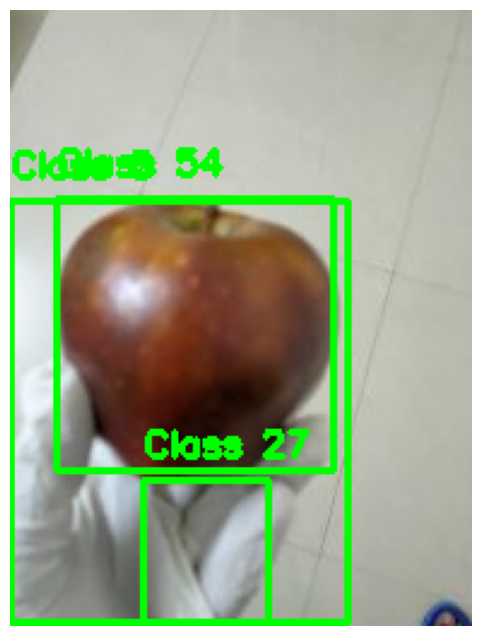

Displaying bounding boxes for: data\Apple_Good\20190809_115439.jpg
Bounding box for class 54: (62, 38), (198, 181)


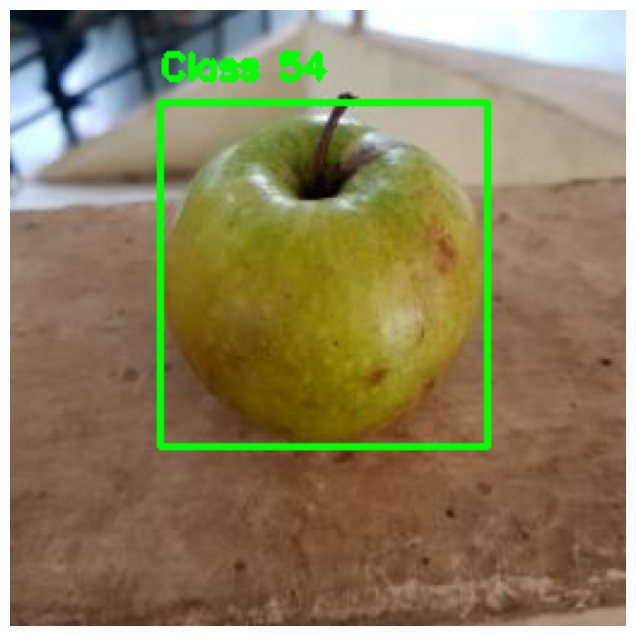

Displaying bounding boxes for: data\Apple_mixed\IMG20200728125930.jpg
Bounding box for class 49: (124, 75), (168, 132)
Bounding box for class 47: (55, 131), (99, 201)
Bounding box for class 47: (142, 16), (183, 72)
Bounding box for class 47: (95, 147), (144, 207)


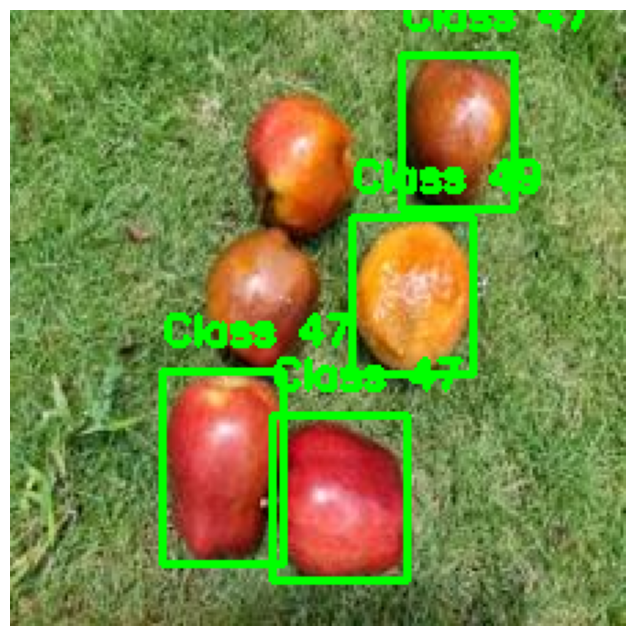

Displaying bounding boxes for: data\Banana_Bad\IMG20200729190307.jpg
Bounding box for class 46: (105, 14), (195, 119)
Bounding box for class 46: (54, 18), (118, 132)


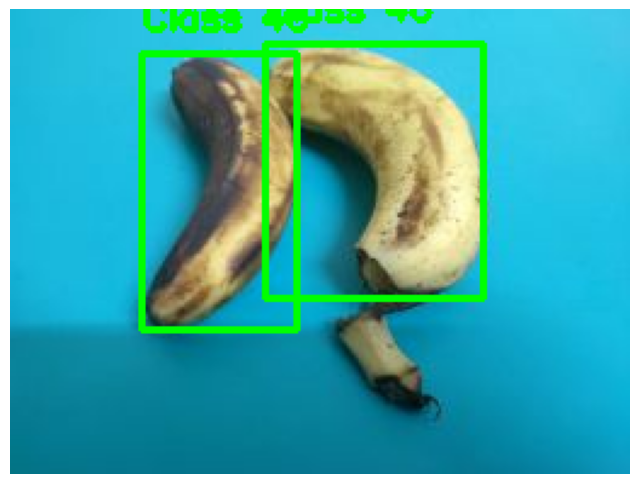

Displaying bounding boxes for: data\Banana_Good\IMG20200729190220.jpg
Bounding box for class 46: (52, 31), (135, 186)
Bounding box for class 46: (76, 33), (194, 189)
Bounding box for class 46: (145, 37), (219, 191)


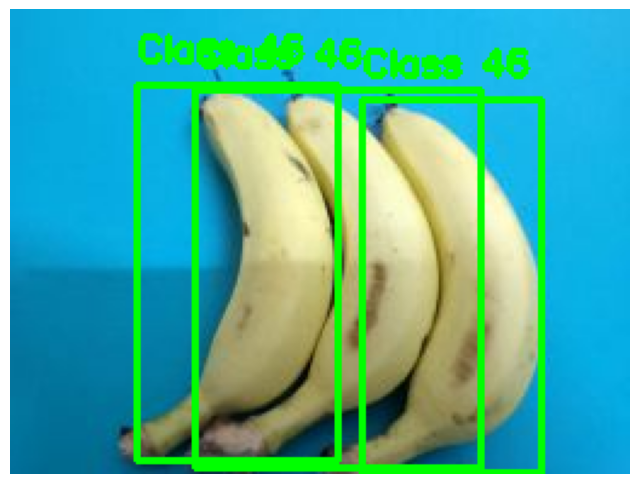

In [46]:
import os
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

def plot_image_with_bboxes(image_path, label_path):
    # Load image
    img = cv2.imread(image_path)
    height, width = img.shape[:2]
    
    # Read the label file and draw bounding boxes
    with open(label_path, "r") as f:
        for line in f:
            values = line.strip().split()
            if len(values) != 5:
                print(f"Unexpected label format in {label_path}: {line}")
                continue
            
            class_id, x_center, y_center, w, h = map(float, values)
            
            # Convert normalized coordinates to absolute values
            x_center, y_center = int(x_center * width), int(y_center * height)
            w, h = int(w * width), int(h * height)
            x1, y1 = int(x_center - w / 2), int(y_center - h / 2)
            x2, y2 = int(x_center + w / 2), int(y_center + h / 2)
            
            # Print bounding box coordinates for verification
            print(f"Bounding box for class {int(class_id)}: ({x1}, {y1}), ({x2}, {y2})")
            
            # Draw bounding box
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, f"Class {int(class_id)}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Display image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    plt.close()

# Main directories
image_base_dir = 'data'  # Folder with images in subfolders
label_base_dir = 'labeled_data'  # Folder with labels in subfolders

# Set the maximum number of images to display
max_images = 5
counter = 0

# Loop through each subfolder and display a sample image with bounding boxes
for subfolder in os.listdir(image_base_dir):
    image_dir = os.path.join(image_base_dir, subfolder)
    label_dir = os.path.join(label_base_dir, subfolder)
    
    if os.path.isdir(image_dir) and os.path.isdir(label_dir):
        # List all images in the subfolder
        image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]
        
        # Check if there are any images in the subfolder
        if image_files:
            # Display a sample image with bounding boxes
            sample_image_path = os.path.join(image_dir, image_files[0])
            sample_label_path = os.path.join(label_dir, os.path.splitext(image_files[0])[0] + ".txt")
            print(f"Displaying bounding boxes for: {sample_image_path}")
            plot_image_with_bboxes(sample_image_path, sample_label_path)
            
            counter += 1
            if counter >= max_images:
                break
    else:
        print(f"Skipping {subfolder} as it doesn't have both images and labels.")



Found 13660 images belonging to 18 classes.


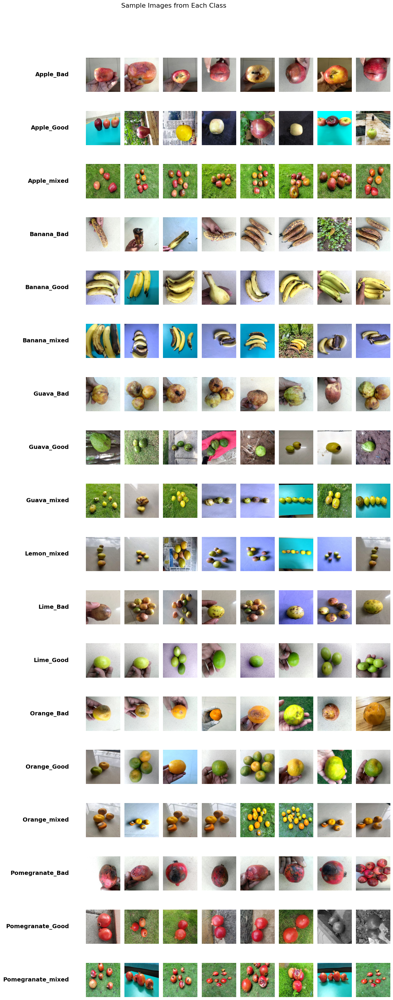

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define path to the training directory
train_dir = r"split_data/train"  # Update this path as needed

# Initialize ImageDataGenerator for loading the data
datagen = ImageDataGenerator(rescale=1.0/255)

# Load data in batches from directory
train_data = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

# Get the class labels
class_labels = list(train_data.class_indices.keys())

# Number of classes and images to show per class
num_classes = len(class_labels)
num_images_per_class = 8

# Set up the plot grid with extra space for labels
fig, ax = plt.subplots(num_classes, num_images_per_class, figsize=(15, num_classes * 2))
fig.suptitle("Sample Images from Each Class", fontsize=16)

# Initialize a dictionary to store images for each class
images_per_class = {label: [] for label in class_labels}

# Collect images until we have the desired amount per class
while any(len(images) < num_images_per_class for images in images_per_class.values()):
    # Load a batch of images and labels
    X_batch, y_batch = next(train_data)

    # For each class, add images until reaching the desired number
    for i, label in enumerate(class_labels):
        class_indices = np.where(y_batch[:, i] == 1)[0]
        needed_images = num_images_per_class - len(images_per_class[label])

        # Add images to the class if more are needed
        for idx in class_indices[:needed_images]:
            images_per_class[label].append(X_batch[idx])

# Plot images with clear labels
for i, label in enumerate(class_labels):
    for j in range(num_images_per_class):
        ax[i, j].imshow(images_per_class[label][j])
        ax[i, j].axis('off')
    
    # Add the class label on the left side of each row
    ax[i, 0].text(-0.5, 0.5, label, rotation=0, ha='right', va='center', 
                  transform=ax[i, 0].transAxes, fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0.1, 0.03, 1, 0.95])  # Adjust layout for label space
plt.show()


